In [1]:
import pandas as pd
import numpy as np

In [2]:
normal_df = pd.read_csv("mimic_normal_data.csv")
normal_df = normal_df.drop(["Unnamed: 0"], axis = 1)
normal_df

,subject_id,charttime,Alanine Aminotransferase (ALT) Blood Chemistry,Alkaline Phosphatase Blood Chemistry,Anion Gap Blood Chemistry,Basophils Blood Hematology,Bicarbonate Blood Chemistry,"Bilirubin, Total Blood Chemistry","Calcium, Total Blood Chemistry",Calculated Total CO2 Blood Blood Gas,...,Phosphate Blood Chemistry,Platelet Count Blood Hematology,Potassium Blood Chemistry,RDW Blood Hematology,Sodium Blood Chemistry,Urea Nitrogen Blood Chemistry,White Blood Cells Blood Hematology,pCO2 Blood Blood Gas,pH Blood Blood Gas,pO2 Blood Blood Gas
0,10006,2170-12-21 05:44:00,17.0,93.6,19.0,0.20,27.0,0.90,10.00,28.4,...,3.52,157.0,4.30,14.54,139.0,13.8,6.64,40.6,7.416,99.4
1,10006,2112-05-04 22:35:00,18.8,100.2,14.2,0.26,24.8,1.04,8.80,28.4,...,3.40,195.2,3.82,13.58,139.0,12.4,6.38,40.6,7.400,99.4
2,10006,2175-10-02 13:30:00,27.8,74.0,11.0,0.22,25.8,0.54,8.70,28.4,...,3.00,187.0,3.40,15.04,145.0,8.0,7.50,40.6,7.416,99.4
3,10006,2175-10-02 14:35:00,13.4,88.6,15.2,0.12,25.6,1.08,9.34,28.4,...,3.34,202.2,3.98,13.78,139.2,11.0,6.88,40.6,7.400,99.4
4,10006,2112-05-05 03:05:00,25.2,66.2,13.0,0.26,28.0,0.74,8.90,28.4,...,4.10,237.0,4.50,14.66,144.0,13.0,7.00,40.6,7.416,99.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4537,44228,2180-01-17 17:20:00,28.4,75.4,12.0,0.06,30.0,0.98,8.94,28.4,...,3.46,258.2,4.10,14.20,140.0,9.0,7.10,42.2,7.416,99.4
4538,44228,2180-01-18 05:35:00,16.8,80.4,11.0,0.18,28.0,1.00,9.00,28.4,...,3.60,258.6,4.40,13.80,138.0,14.4,6.24,42.2,7.410,99.4
4539,44228,2180-01-19 09:05:00,20.0,81.2,12.0,0.12,28.0,1.20,8.90,28.4,...,3.30,256.4,4.20,13.80,139.0,7.0,6.88,42.2,7.410,99.4
4540,44228,2180-01-20 06:15:00,18.0,64.4,11.0,0.12,29.0,1.04,8.90,28.4,...,4.00,258.4,4.40,13.80,139.0,15.0,6.40,42.2,7.416,99.4


In [3]:
normal_df["charttime"] = pd.to_datetime(normal_df['charttime'])

In [4]:
normal_df = normal_df.sort_values(by='charttime')

In [5]:
normal_df

,subject_id,charttime,Alanine Aminotransferase (ALT) Blood Chemistry,Alkaline Phosphatase Blood Chemistry,Anion Gap Blood Chemistry,Basophils Blood Hematology,Bicarbonate Blood Chemistry,"Bilirubin, Total Blood Chemistry","Calcium, Total Blood Chemistry",Calculated Total CO2 Blood Blood Gas,...,Phosphate Blood Chemistry,Platelet Count Blood Hematology,Potassium Blood Chemistry,RDW Blood Hematology,Sodium Blood Chemistry,Urea Nitrogen Blood Chemistry,White Blood Cells Blood Hematology,pCO2 Blood Blood Gas,pH Blood Blood Gas,pO2 Blood Blood Gas
2196,10098,2112-04-12 07:30:00,20.369942,78.057057,11.800000,0.23475,27.600000,0.59328,8.93312,22.000000,...,3.476514,255.620162,3.800000,14.560000,139.60000,11.000000,7.580000,41.200000,7.372000,95.600000
2871,40124,2112-04-12 07:30:00,21.800000,94.200000,16.600000,0.16000,26.000000,0.62000,8.76000,28.400000,...,3.740000,237.200000,4.400000,14.140000,137.40000,15.200000,8.500000,40.600000,7.400000,99.400000
846,10038,2112-04-12 07:30:00,20.369942,103.400000,13.200000,0.23475,27.200000,0.68000,8.93312,25.400000,...,3.600000,255.620162,3.980000,14.560000,139.60000,10.000000,7.580000,41.200000,7.380000,100.000000
2946,40204,2112-04-12 07:30:00,27.000000,75.600000,12.200000,0.20000,26.000000,0.54000,9.02000,27.600000,...,3.760000,249.600000,4.000000,15.500000,137.00000,12.600000,6.900000,41.600000,7.378000,110.000000
3021,40286,2112-04-12 07:30:00,20.369942,78.057057,13.330993,0.23475,26.038334,0.59328,8.93312,25.801351,...,3.476514,255.620162,4.021511,14.436563,139.27888,13.219866,7.425653,40.736041,7.400711,95.768987
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
423,10027,2180-01-22 10:08:00,22.600000,71.400000,15.000000,0.14000,24.000000,0.96000,8.66000,28.400000,...,2.980000,220.200000,3.700000,14.780000,139.00000,12.000000,5.300000,42.200000,7.416000,99.400000
4473,44212,2180-01-22 10:08:00,20.369942,103.400000,11.400000,0.23475,27.000000,0.68000,8.93312,23.000000,...,3.600000,255.620162,3.980000,14.560000,139.60000,9.200000,7.580000,42.800000,7.420000,92.800000
1923,10088,2180-01-22 10:08:00,20.369942,78.057057,13.330993,0.23475,26.038334,0.59328,8.93312,25.801351,...,3.476514,255.620162,4.021511,14.436563,139.27888,13.219866,7.425653,40.736041,7.400711,95.768987
4248,43827,2180-01-22 10:08:00,32.600000,73.200000,10.000000,0.28000,23.000000,0.62000,9.02000,28.400000,...,2.800000,227.800000,3.500000,14.400000,140.00000,14.800000,9.000000,42.200000,7.416000,99.400000


In [6]:
abn = pd.read_csv("mimic_abnormal_data.csv")
abn = abn.drop(["Unnamed: 0"], axis = 1)
abn

,subject_id,charttime,Alanine Aminotransferase (ALT) Blood Chemistry,Alkaline Phosphatase Blood Chemistry,Anion Gap Blood Chemistry,Basophils Blood Hematology,Bicarbonate Blood Chemistry,"Bilirubin, Total Blood Chemistry","Calcium, Total Blood Chemistry",Calculated Total CO2 Blood Blood Gas,...,Phosphate Blood Chemistry,Platelet Count Blood Hematology,Potassium Blood Chemistry,RDW Blood Hematology,Sodium Blood Chemistry,Urea Nitrogen Blood Chemistry,White Blood Cells Blood Hematology,pCO2 Blood Blood Gas,pH Blood Blood Gas,pO2 Blood Blood Gas
0,10006,2171-07-14 15:12:00,139.200000,220.800000,12.600000,4.2,27.000000,9.96,8.640000,27.161972,...,5.600000,110.400000,2.960000,17.800000,133.400000,31.000000,23.700000,44.662609,7.355461,131.058824
1,10006,2171-07-14 16:24:00,933.600000,209.600000,9.400000,4.2,30.000000,12.96,8.660000,27.161972,...,5.300000,95.000000,4.420000,17.900000,129.400000,34.000000,22.700000,44.662609,7.355461,131.058824
2,10006,2171-07-14 18:23:00,1469.400000,263.200000,15.600000,4.2,37.200000,7.54,8.060000,27.161972,...,6.400000,89.000000,2.920000,17.900000,137.200000,42.000000,19.700000,44.662609,7.355461,131.058824
3,10006,2171-07-14 20:05:00,563.053232,273.841699,21.135714,4.2,23.778997,15.60,7.908323,27.161972,...,3.877097,116.568544,4.043011,17.860161,138.375796,47.430269,12.401607,44.662609,7.355461,131.058824
4,10006,2171-07-14 21:14:00,126.400000,217.000000,21.000000,4.2,22.600000,18.88,8.040000,27.161972,...,1.940000,127.000000,3.540000,18.200000,136.800000,32.200000,15.400000,44.662609,7.355461,131.058824
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4461,44228,2171-07-16 22:19:00,575.400000,185.000000,6.600000,4.2,27.600000,19.26,7.700000,27.161972,...,3.620000,172.600000,3.600000,16.680000,140.000000,54.800000,15.500000,44.662609,7.355461,131.058824
4462,44228,2171-07-17 01:43:00,141.400000,188.000000,21.800000,4.2,19.400000,15.82,7.840000,27.161972,...,3.960000,202.200000,4.540000,17.340000,134.800000,49.600000,13.700000,44.662609,7.355461,131.058824
4463,44228,2171-07-17 02:21:00,560.000000,310.600000,16.600000,4.2,22.600000,3.18,8.440000,27.161972,...,2.300000,475.000000,4.000000,16.560000,135.000000,29.600000,17.200000,44.662609,7.355461,131.058824
4464,44228,2171-07-17 07:00:00,110.800000,255.800000,14.600000,4.2,29.000000,18.62,8.200000,27.161972,...,3.540000,536.000000,3.900000,17.280000,139.600000,47.200000,16.800000,44.662609,7.355461,131.058824


## Model Preparation

In [7]:
import numpy as np
from keras.models import Sequential
from keras.layers import LSTM, Input, Dropout
from keras.layers import Dense
from keras.layers import RepeatVector
from keras.layers import TimeDistributed
import pandas as pd
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split
from keras.models import Model
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import BayesianRidge
from sklearn.utils import check_random_state
import seaborn as sns
import torch
import torch.nn as nn

2024-12-13 00:32:56.983243: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1734030177.088877 2190456 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1734030177.212607 2190456 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-13 00:32:58.428209: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Normalize the data

In [8]:
# Prepare the data
def prepare_data(normal_df, abnormal_df):
    
    df_norm_col = normal_df.columns[2:]
    

    # Normalize the data
    scaler = MinMaxScaler()
    normal_df[df_norm_col] = scaler.fit_transform(normal_df[df_norm_col])
    abnormal_df[df_norm_col] = scaler.transform(abnormal_df[df_norm_col])

    return normal_df, abnormal_df

In [32]:
normal_data, abnormal_data = prepare_data(normal_df, abn)


In [35]:
normal_data.sample()

,subject_id,charttime,Alanine Aminotransferase (ALT) Blood Chemistry,Alkaline Phosphatase Blood Chemistry,Anion Gap Blood Chemistry,Basophils Blood Hematology,Bicarbonate Blood Chemistry,"Bilirubin, Total Blood Chemistry","Calcium, Total Blood Chemistry",Calculated Total CO2 Blood Blood Gas,...,Phosphate Blood Chemistry,Platelet Count Blood Hematology,Potassium Blood Chemistry,RDW Blood Hematology,Sodium Blood Chemistry,Urea Nitrogen Blood Chemistry,White Blood Cells Blood Hematology,pCO2 Blood Blood Gas,pH Blood Blood Gas,pO2 Blood Blood Gas
2639,10120,2170-12-20 06:30:00,0.496665,0.430896,0.266667,0.117375,0.768421,0.352343,0.28059,0.363636,...,0.431396,0.368015,0.25,0.77619,0.44,0.357143,0.511429,0.265306,0.48,0.272374


In [34]:
abnormal_data.sample()

,subject_id,charttime,Alanine Aminotransferase (ALT) Blood Chemistry,Alkaline Phosphatase Blood Chemistry,Anion Gap Blood Chemistry,Basophils Blood Hematology,Bicarbonate Blood Chemistry,"Bilirubin, Total Blood Chemistry","Calcium, Total Blood Chemistry",Calculated Total CO2 Blood Blood Gas,...,Phosphate Blood Chemistry,Platelet Count Blood Hematology,Potassium Blood Chemistry,RDW Blood Hematology,Sodium Blood Chemistry,Urea Nitrogen Blood Chemistry,White Blood Cells Blood Hematology,pCO2 Blood Blood Gas,pH Blood Blood Gas,pO2 Blood Blood Gas
2487,10117,2171-07-15 11:37:00,24.774359,2.707462,0.785317,2.1,0.567316,11.071429,-0.258777,0.818182,...,0.653943,-0.116486,0.371505,1.561943,0.358386,2.959305,1.20023,0.395918,0.96,0.319066


### Convert data into tensors for LSTM

In [10]:
def sequence_tensor(data):
    unique_subjects = data['subject_id'].unique()
    unique_charttimes = data['charttime'].unique()
    num_tests = len(data.columns) - 2
    
    tensor_data = np.full((len(unique_subjects), len(unique_charttimes), num_tests), np.nan)
    
    subject_to_idx = {subject: i for i, subject in enumerate(unique_subjects)}
    charttime_to_idx = {time: i for i, time in enumerate(unique_charttimes)}
    
    
    for _, row in data.iterrows():
        subject_idx = subject_to_idx[row['subject_id']]
        charttime_idx = charttime_to_idx[row['charttime']]
        lab_test_values = row[2:].values  # Exclude 'subject_id' and 'charttime'
        tensor_data[subject_idx, charttime_idx, :] = lab_test_values
        
    for feature_idx in range(tensor_data.shape[2]):  # Loop through each feature
        feature_values = tensor_data[:, :, feature_idx]  # Extract all values for the current feature
        feature_mean = np.nanmean(feature_values)  # Compute the mean, ignoring NaN
        tensor_data[:, :, feature_idx] = np.nan_to_num(feature_values, nan=feature_mean)  # Fill NaN with the mean
        
    
    sequences = torch.tensor(tensor_data, dtype=torch.float32)
    
    return sequences
    

In [11]:
# unique_subjects = normal_df['subject_id'].unique()
# unique_charttimes = normal_df['charttime'].unique()
# num_tests = len(normal_df.columns) - 2 

In [12]:
# tensor_data = np.full((len(unique_subjects), len(unique_charttimes), num_tests), np.nan)

In [91]:
# subject_to_idx = {subject: i for i, subject in enumerate(unique_subjects)}
# charttime_to_idx = {time: i for i, time in enumerate(unique_charttimes)}

In [92]:
# for _, row in normal_df.iterrows():
#     subject_idx = subject_to_idx[row['subject_id']]
#     charttime_idx = charttime_to_idx[row['charttime']]
#     lab_test_values = row[2:].values  # Exclude 'subject_id' and 'charttime'
#     tensor_data[subject_idx, charttime_idx, :] = lab_test_values

In [93]:
# for feature_idx in range(tensor_data.shape[2]):  # Loop through each feature
#     feature_values = tensor_data[:, :, feature_idx]  # Extract all values for the current feature
#     feature_mean = np.nanmean(feature_values)  # Compute the mean, ignoring NaN
#     tensor_data[:, :, feature_idx] = np.nan_to_num(feature_values, nan=feature_mean)  # Fill NaN with the mean

In [94]:
# # Convert the filled NumPy array to a PyTorch tensor
# normal_sequences = torch.tensor(tensor_data, dtype=torch.float32)

In [36]:
normal_sequences = sequence_tensor(normal_data)
normal_sequences

tensor([[[0.4967, 0.4309, 0.2667,  ..., 0.3102, 0.4080, 0.2591],
         [0.3436, 0.5023, 0.3444,  ..., 0.2980, 0.5200, 0.2739],
         [0.4967, 0.7256, 0.2444,  ..., 0.2245, 0.5200, 0.2568],
         ...,
         [0.3385, 0.4977, 0.4889,  ..., 0.3184, 0.4320, 0.3152],
         [0.4967, 0.7256, 0.3444,  ..., 0.3061, 0.6000, 0.2023],
         [0.4967, 0.4309, 0.3517,  ..., 0.3007, 0.5228, 0.2598]],

        [[0.5333, 0.6186, 0.5333,  ..., 0.2980, 0.5200, 0.2739],
         [0.4967, 0.7256, 0.2444,  ..., 0.1837, 0.9200, 0.8949],
         [0.4967, 0.4309, 0.3517,  ..., 0.3007, 0.5228, 0.2598],
         ...,
         [0.6667, 0.4047, 0.4444,  ..., 0.3306, 0.5840, 0.2739],
         [0.5641, 0.4419, 0.3889,  ..., 0.3306, 0.5840, 0.2739],
         [0.4872, 0.4116, 0.6111,  ..., 0.3306, 0.5840, 0.2739]],

        [[0.4967, 0.7256, 0.3444,  ..., 0.3102, 0.4400, 0.2763],
         [0.6308, 0.3814, 0.2778,  ..., 0.3306, 0.5840, 0.2739],
         [0.4967, 0.7256, 0.2444,  ..., 0.2490, 0.5600, 0.

In [37]:
normal_sequences.shape

torch.Size([100, 75, 29])

In [38]:
abnormal_sequence = sequence_tensor(abnormal_data)

### Data Preparation

In [39]:
train_data, val_data = train_test_split(normal_sequences, test_size=0.3, random_state=42)
val_data, test_normal_data = train_test_split(val_data, test_size=0.33, random_state=42) 

In [40]:
train_data.shape

torch.Size([70, 75, 29])

In [41]:
## identify the test-set for anomaly

test_anomaly_dataset = abnormal_sequence[:len(test_normal_data)]

In [42]:
print(test_normal_data.shape)
print(test_anomaly_dataset.shape)

torch.Size([10, 75, 29])
torch.Size([10, 75, 29])


## GPU Availability

In [43]:
print("PyTorch Version:", torch.__version__)
print("CUDA Available:", torch.cuda.is_available())
print("Current CUDA Device:", torch.cuda.current_device())
print("CUDA Device Name:", torch.cuda.get_device_name(torch.cuda.current_device()))
print("Number of GPUs:", torch.cuda.device_count())

PyTorch Version: 2.5.1+cu118
CUDA Available: True
Current CUDA Device: 0
CUDA Device Name: NVIDIA RTX A6000
Number of GPUs: 1


In [20]:
# ## activate the gpu

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [21]:
# device = torch.device("cpu")

## LSTM - Autoencoder Model

### Encoder

In [22]:
# ## ENCODER - 1

# class Encoder(nn.Module):
#     def __init__(self, n_features, embedding_dim=64):
#         super(Encoder, self).__init__()
#         self.rnn = nn.LSTM(
#             input_size=n_features,
#             hidden_size=embedding_dim,
#             num_layers=1,
#             batch_first=True
#         )

#     def forward(self, x):
#         _, (hidden, _) = self.rnn(x)
#         return hidden


In [23]:
class Encoder(nn.Module):
    def __init__(self, seq_len, n_features, embedding_dim=64):
        super(Encoder, self).__init__()
        self.seq_len, self.n_features = seq_len, n_features
        self.embedding_dim, self.hidden_dim = embedding_dim, 2 * embedding_dim
        self.rnn1 = nn.LSTM(
            input_size=n_features,
            hidden_size=self.hidden_dim,
            num_layers=1,
            batch_first=True
        )
        self.rnn2 = nn.LSTM(
            input_size=self.hidden_dim,
            hidden_size=embedding_dim,
            num_layers=1,
            batch_first=True
        )
        
    def forward(self, x):
        # x: (batch_size, seq_len, n_features)
        x, (_, _) = self.rnn1(x)  # Output: (batch_size, seq_len, hidden_dim)
        x, (hidden_n, _) = self.rnn2(x)  # hidden_n: (1, batch_size, embedding_dim)
        return hidden_n.permute(1, 0, 2)  # Return: (batch_size, 1, embedding_dim)


### Decoder

In [24]:
# ## DECODER - 1

# class Decoder(nn.Module):
#     def __init__(self, seq_len, embedding_dim, n_features):
#         super(Decoder, self).__init__()
#         self.rnn = nn.LSTM(
#             input_size=embedding_dim,
#             hidden_size=n_features,
#             num_layers=1,
#             batch_first=True
#         )
#         self.output_layer = nn.Linear(n_features, n_features)

#     def forward(self, x, seq_len):
#         x = x.repeat(seq_len, 1, 1).permute(1, 0, 2)  # Repeat hidden state across time steps
#         x, _ = self.rnn(x)
#         return self.output_layer(x)


In [25]:
class Decoder(nn.Module):
    def __init__(self, seq_len, input_dim=64, n_features=1):
        super(Decoder, self).__init__()
        self.seq_len, self.input_dim = seq_len, input_dim
        self.hidden_dim, self.n_features = 2 * input_dim, n_features
        self.rnn1 = nn.LSTM(
            input_size=input_dim,
            hidden_size=input_dim,
            num_layers=1,
            batch_first=True
        )
        self.rnn2 = nn.LSTM(
            input_size=input_dim,
            hidden_size=self.hidden_dim,
            num_layers=1,
            batch_first=True
        )
        self.output_layer = nn.Linear(self.hidden_dim, n_features)
      
    def forward(self, x):
        # x: (batch_size, 1, input_dim)
        x = x.repeat(1, self.seq_len, 1)  # Repeat latent vector across seq_len
        # x: (batch_size, seq_len, input_dim)
        x, (hidden_n, cell_n) = self.rnn1(x)  # Output: (batch_size, seq_len, input_dim)
        x, (hidden_n, cell_n) = self.rnn2(x)  # Output: (batch_size, seq_len, hidden_dim)
        x = x.reshape((-1, self.hidden_dim))  # Flatten batch for output layer
        return self.output_layer(x).reshape((-1, self.seq_len, self.n_features))


### Incorporate the encoder and decoder

In [26]:
class RecurrentAutoencoder(nn.Module):
    def __init__(self, seq_len, n_features, embedding_dim):
        super(RecurrentAutoencoder, self).__init__()
        self.encoder = Encoder(seq_len, n_features, embedding_dim).to(device)
        self.decoder = Decoder(seq_len, embedding_dim, n_features).to(device)

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded


### Model Training

In [27]:
def train_model(model, train_data, val_data, n_epochs, learning_rate=1e-3):
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
    criterion = nn.MSELoss()
    history = {'train_loss': [], 'val_loss': []}

    for epoch in range(n_epochs):
        # Training Phase
        model.train()
        train_losses = []
        for seq in train_data:
            optimizer.zero_grad()
            seq = seq.unsqueeze(0).to(device)  # Add batch dimension
            reconstructed = model(seq)
            loss = criterion(reconstructed, seq)
            loss.backward()
            optimizer.step()
            train_losses.append(loss.item())

        # Validation Phase
        model.eval()
        val_losses = []
        with torch.no_grad():
            for seq in val_data:
                seq = seq.unsqueeze(0).to(device)
                reconstructed = model(seq)
                loss = criterion(reconstructed, seq)
                val_losses.append(loss.item())

        # Record losses
        train_loss = np.mean(train_losses)
        val_loss = np.mean(val_losses)
        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)

        print(f"Epoch {epoch + 1}/{n_epochs}, Train Loss: {train_loss}, Val Loss: {val_loss}")

    return model, history


In [111]:
# train_data, val_data = train_test_split(tensor_data, test_size=0.15, random_state=42)
# val_data, test_normal_data = train_test_split(val_data, test_size=0.33, random_state=42)

# # Convert datasets to PyTorch tensors
# train_data = torch.tensor(train_data, dtype=torch.float32)
# val_data = torch.tensor(val_data, dtype=torch.float32)
# test_normal_data = torch.tensor(test_normal_data, dtype=torch.float32)

# # Move data to PyTorch DataLoader for batch processing if necessary
# train_loader = torch.utils.data.DataLoader(train_data, batch_size=16, shuffle=True)
# val_loader = torch.utils.data.DataLoader(val_data, batch_size=16, shuffle=False)

In [44]:
# Define model parameters
seq_len = train_data.size(1)  # Sequence length (75)
n_features = train_data.size(2)  # Number of features (29)
embedding_dim = 64

In [45]:
seq_len

75

In [46]:
model = RecurrentAutoencoder(seq_len, n_features, embedding_dim).to(device)

# Train the model
n_epochs = 200
model, history = train_model(model, train_data, val_data, n_epochs=n_epochs)

Epoch 1/200, Train Loss: 0.03884368125748421, Val Loss: 0.012914749584160745
Epoch 2/200, Train Loss: 0.011192581223856126, Val Loss: 0.011470397957600654
Epoch 3/200, Train Loss: 0.010278350221259253, Val Loss: 0.010979610960930586
Epoch 4/200, Train Loss: 0.009978684370539018, Val Loss: 0.010774867516011
Epoch 5/200, Train Loss: 0.009846333248008574, Val Loss: 0.01069481240119785
Epoch 6/200, Train Loss: 0.009789411783484477, Val Loss: 0.01066104720812291
Epoch 7/200, Train Loss: 0.009763258289811866, Val Loss: 0.010645348695106804
Epoch 8/200, Train Loss: 0.009749237255060246, Val Loss: 0.010637651360593737
Epoch 9/200, Train Loss: 0.009740009278591191, Val Loss: 0.010633209138177335
Epoch 10/200, Train Loss: 0.009733005353648747, Val Loss: 0.010630399733781815
Epoch 11/200, Train Loss: 0.009727274480142763, Val Loss: 0.010628666100092232
Epoch 12/200, Train Loss: 0.009722347504326276, Val Loss: 0.010627242759801448
Epoch 13/200, Train Loss: 0.009718053229153156, Val Loss: 0.0106262

In [48]:
# save the model

torch.save(model, "model.pth")

### Plot the History

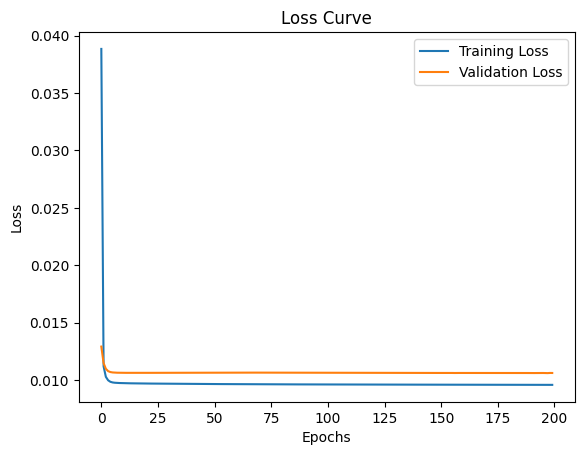

In [47]:
plt.plot(history['train_loss'], label='Training Loss')
plt.plot(history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Loss Curve')
plt.show()

## Loading the Model

In [53]:
model = torch.load("model_new.pth") 
model.eval()

/tmp/ipykernel_2190456/2461073950.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("model_new.pth")


RecurrentAutoencoder(
  (encoder): Encoder(
    (rnn1): LSTM(29, 128, batch_first=True)
    (rnn2): LSTM(128, 64, batch_first=True)
  )
  (decoder): Decoder(
    (rnn1): LSTM(64, 64, batch_first=True)
    (rnn2): LSTM(64, 128, batch_first=True)
    (output_layer): Linear(in_features=128, out_features=29, bias=True)
  )
)

## Anomaly Detection

In [50]:
def predict(model, data):
    criterion = nn.MSELoss(reduction='none')
    losses = []

    with torch.no_grad():
        for seq in data:
            seq = seq.unsqueeze(0).to(device)
            reconstructed = model(seq)
            loss = criterion(reconstructed, seq).mean().item()
            losses.append(loss)

    return np.array(losses)

In [51]:
test_anomaly_dataset.shape

torch.Size([10, 75, 29])

In [52]:
# Predict losses for normal and abnormal data
normal_losses = predict(model, test_normal_data)
anomaly_losses = predict(model, test_anomaly_dataset)

### Visualize the normal and anomaly loss

/tmp/ipykernel_1999641/3563184810.py:5: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


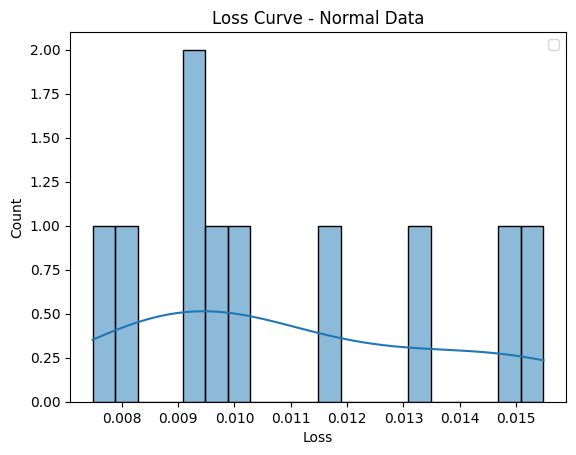

In [121]:
sns.histplot(normal_losses, bins= 20, kde=True)

plt.xlabel('Loss')
plt.ylabel('Count')
plt.legend()
plt.title('Loss Curve - Normal Data')
plt.show()

In [122]:
## Define the Threshold point

THRESHOLD = np.percentile(normal_losses, 99.99)
THRESHOLD

0.01548452167669311

### Performance Evaluation

In [125]:
# Evaluate performance
normal_preds = normal_losses > THRESHOLD
anomaly_preds = anomaly_losses > THRESHOLD

# Print evaluation results
print(f"Normal Data Above Threshold: {np.sum(normal_preds)}/{len(normal_losses)}")
print(f"Anomaly Data Above Threshold: {np.sum(anomaly_preds)}/{len(anomaly_losses)}")

Normal Data Above Threshold: 1/10
Anomaly Data Above Threshold: 10/10


### Checking for Test Sample

In [132]:
test_data = abn.loc[2000].values
test_data

array([10093, '2171-07-18 03:54:00', 5.358974358974359,
       0.9767441860465116, 0.34444444444444444, 2.1, 0.42105263157894735,
       20.785714285714285, -0.05263157894736814, 0.7636363636363634,
       0.9500000000000002, 1.6666666666666667, 1.44, 0.9000000000000004,
       0.07126436781609194, 0.22800000000000065, 0.8900000000000006,
       -0.375, 0.7399999999999998, 0.5652631578947368, 1.0,
       2.333333333333333, -0.1393728222996516, 0.41000000000000014,
       3.142857142857143, -0.13333333333333464, 11.071428571428571,
       1.6285714285714283, 0.5877551020408163, 0.6320000000000014,
       0.31673151750972767], dtype=object)

In [137]:
test_anomaly_dataset.shape

torch.Size([10, 75, 29])

In [174]:
def model_prediction_time_step(input_data): 
    criterion = nn.MSELoss(reduction='none')

    seq = input_data.to(device).unsqueeze(0)

    with torch.no_grad():
        reconstructed = model(seq)  # Reconstruct the input
        losses = torch.mean((seq - reconstructed) ** 2, dim=2).squeeze(0)  # Compute reconstruction loss

    return losses.cpu().detach().numpy().tolist()

In [173]:
def predict(model, data):
    criterion = nn.MSELoss(reduction='none')
    losses = []

    with torch.no_grad():
        for seq in data:
            seq = seq.unsqueeze(0).to(device)
            reconstructed = model(seq)
            loss = criterion(reconstructed, seq).mean().item()
            losses.append(loss)

    return np.array(losses)

In [178]:
vb = test_anomaly_dataset[9]
vb.shape

torch.Size([75, 29])

In [180]:
test_losses = model_prediction_time_step(vb)
test_losses

[2.6531646251678467,
 24.97401237487793,
 25.08216094970703,
 2.0668282508850098,
 25.522804260253906,
 25.2017822265625,
 2.392421245574951,
 25.16282081604004,
 25.222412109375,
 2.780154228210449,
 25.307579040527344,
 11.20715045928955,
 1.3024715185165405,
 5.993190288543701,
 25.171932220458984,
 24.897628784179688,
 2.3677358627319336,
 4.587784290313721,
 25.650087356567383,
 1.5731931924819946,
 12.086158752441406,
 2.3982441425323486,
 25.618083953857422,
 25.262666702270508,
 25.110427856445312,
 2.7331206798553467,
 28.185440063476562,
 11.572579383850098,
 10.084199905395508,
 25.13823127746582,
 25.15154457092285,
 11.487125396728516,
 25.076086044311523,
 25.033733367919922,
 11.892366409301758,
 10.124385833740234,
 10.160165786743164,
 10.191593170166016,
 10.201871871948242,
 10.187603950500488,
 10.17884349822998,
 10.171222686767578,
 10.172091484069824,
 10.177847862243652,
 10.17558479309082,
 4.733892917633057,
 25.76884651184082,
 8.325382232666016,
 11.47025299

In [182]:
for k in test_losses:
    print(k)

2.6531646251678467
24.97401237487793
25.08216094970703
2.0668282508850098
25.522804260253906
25.2017822265625
2.392421245574951
25.16282081604004
25.222412109375
2.780154228210449
25.307579040527344
11.20715045928955
1.3024715185165405
5.993190288543701
25.171932220458984
24.897628784179688
2.3677358627319336
4.587784290313721
25.650087356567383
1.5731931924819946
12.086158752441406
2.3982441425323486
25.618083953857422
25.262666702270508
25.110427856445312
2.7331206798553467
28.185440063476562
11.572579383850098
10.084199905395508
25.13823127746582
25.15154457092285
11.487125396728516
25.076086044311523
25.033733367919922
11.892366409301758
10.124385833740234
10.160165786743164
10.191593170166016
10.201871871948242
10.187603950500488
10.17884349822998
10.171222686767578
10.172091484069824
10.177847862243652
10.17558479309082
4.733892917633057
25.76884651184082
8.325382232666016
11.470252990722656
23.934968948364258
11.462315559387207
25.151535034179688
25.158479690551758
25.1561927795

In [183]:
## checking for anomaly
for k in test_losses:
    is_anomaly = k > THRESHOLD

    # Print results
    print(f"Reconstruction Loss: {k}")
    print(f"Is Anomaly: {'Yes' if is_anomaly else 'No'}")

Reconstruction Loss: 2.6531646251678467
Is Anomaly: Yes
Reconstruction Loss: 24.97401237487793
Is Anomaly: Yes
Reconstruction Loss: 25.08216094970703
Is Anomaly: Yes
Reconstruction Loss: 2.0668282508850098
Is Anomaly: Yes
Reconstruction Loss: 25.522804260253906
Is Anomaly: Yes
Reconstruction Loss: 25.2017822265625
Is Anomaly: Yes
Reconstruction Loss: 2.392421245574951
Is Anomaly: Yes
Reconstruction Loss: 25.16282081604004
Is Anomaly: Yes
Reconstruction Loss: 25.222412109375
Is Anomaly: Yes
Reconstruction Loss: 2.780154228210449
Is Anomaly: Yes
Reconstruction Loss: 25.307579040527344
Is Anomaly: Yes
Reconstruction Loss: 11.20715045928955
Is Anomaly: Yes
Reconstruction Loss: 1.3024715185165405
Is Anomaly: Yes
Reconstruction Loss: 5.993190288543701
Is Anomaly: Yes
Reconstruction Loss: 25.171932220458984
Is Anomaly: Yes
Reconstruction Loss: 24.897628784179688
Is Anomaly: Yes
Reconstruction Loss: 2.3677358627319336
Is Anomaly: Yes
Reconstruction Loss: 4.587784290313721
Is Anomaly: Yes
Recon

## Bayesian Viewpoint - BayesLIME

In [184]:
from lime.lime_tabular import LimeTabularExplainer
import numpy as np

# Initialize BayesLIME Explainer
def initialize_explainer(data, feature_names):
    explainer = LimeTabularExplainer(
        data,
        feature_names=feature_names,
        mode='regression',
        discretize_continuous=True
    )
    
    return explainer

In [189]:
def model_prediction_explainer(perturbations):
    """
    Custom prediction function for LIME that handles multiple perturbed samples.
    Args:
        perturbations: numpy array of perturbed samples (shape: [num_samples, num_features])
    Returns:
        Array of reconstruction losses for all perturbed samples.
    """
    # Convert to PyTorch tensor
    perturbations_tensor = torch.tensor(perturbations, dtype=torch.float32).to(device)
    
    perturbations_tensor = perturbations_tensor.unsqueeze(1)
    # Perform prediction for all perturbed samples
    with torch.no_grad():
        reconstructed = model(perturbations_tensor)
        losses = torch.mean((perturbations_tensor - reconstructed) ** 2, dim=(1, 2))  # Compute reconstruction loss
    
    # Return the losses as a numpy array
    return losses.cpu().numpy()

In [202]:
model_prediction_explainer(test_anomaly_dataset[2])

/tmp/ipykernel_1999641/1693695628.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  perturbations_tensor = torch.tensor(perturbations, dtype=torch.float32).to(device)


array([17.186525  ,  0.7407996 , 15.454188  ,  0.99810594, 11.560841  ,
        1.5634501 ,  1.5428904 ,  2.094343  , 11.718292  , 11.659024  ,
       11.560841  , 17.451658  , 17.569582  , 41.414585  ,  0.88245785,
       11.560841  , 16.968658  , 20.939066  , 10.219866  , 10.219866  ,
       10.219866  , 10.219866  , 10.219866  , 10.219866  , 10.219866  ,
       10.219866  , 10.219866  ,  9.084333  ,  8.905734  ,  3.0714297 ,
       13.095779  , 11.560841  , 11.560841  , 11.560841  ,  1.4115329 ,
        8.007314  , 20.566792  ,  8.953594  , 33.38149   , 22.76553   ,
        2.7976742 ,  2.2633479 ,  5.9051013 , 11.560841  , 21.061274  ,
       39.563152  , 12.551385  , 14.3229265 , 66.663895  , 28.36904   ,
        5.974685  , 14.826126  , 11.560841  ,  4.5265455 ,  8.917915  ,
       11.560841  , 11.580944  , 24.580938  ,  5.3858705 ,  2.3963811 ,
       11.560841  ,  3.1831295 , 11.560841  , 22.498007  , 11.560841  ,
        3.1575122 , 11.560841  ,  6.338747  ,  5.732473  , 11.56

In [193]:
# Predict anomalies and compute losses
normal_losses = predict(model, test_normal_data)
anomaly_losses = predict(model, test_anomaly_dataset)

In [194]:
# Set dynamic threshold (99th percentile of normal losses)
THRESHOLD = np.percentile(normal_losses, 99)

detected_anomalies = test_anomaly_dataset[anomaly_losses > THRESHOLD]


feature_names = normal_df.drop(columns=['subject_id', 'charttime']).columns.tolist()

In [195]:
## The BayesLIME explainer is expecting the type of the input data will be - numpy array
## so conversion from tensor to array

detected_anomalies_np = detected_anomalies.cpu().numpy() 
detected_anomalies_np.shape

(10, 75, 29)

In [222]:
## Fix the data for testing for patient

sample = detected_anomalies_np[9]
sample.shape

(75, 29)

In [196]:
## flatten the input data from (batch_size, seq_len, num_features) to (batch_size, seq_len * num_features)

detected_anomalies_flat = detected_anomalies_np.reshape(-1, detected_anomalies_np.shape[2])
detected_anomalies_flat.shape

(750, 29)

In [216]:
## Initialize the explainer

explainer = initialize_explainer(sample, feature_names)
explainer

In [209]:
## Passing the all time-stamp of any perticular patient
x = detected_anomalies_flat
x = x[:75]
x.shape

(75, 29)

In [221]:
sample

3.6923077

In [223]:
c = 0
for sam in sample[:10]:

    c = c+1
    sample_to_explain = sam 
    explanation = explainer.explain_instance(
        sample_to_explain,         # The instance to explain (flattened anomaly sample)
        model_prediction_explainer,  # Custom prediction function
        num_samples=1000           # Number of perturbations to generate
    )
    print("Feature Importance for the time-stamp ------> {}".format(c))
    
    for feature, importance in explanation.as_list():
        print(f"{feature}: {importance:.4f}")

    # Optional: Visualize the explanation
    explanation.show_in_notebook(show_table=True)

Feature Importance for the time-stamp ------> 1
Alanine Aminotransferase (ALT) Blood Chemistry <= 13.76: -15.0817
Bilirubin, Total Blood Chemistry <= 10.12: -3.1729
Alkaline Phosphatase Blood Chemistry > 2.71: 2.0553
MCHC Blood Hematology > 0.80: -0.8446
White Blood Cells Blood Hematology > 1.62: 0.7016
Creatinine Blood Chemistry <= 2.42: -0.6836
Potassium Blood Chemistry > 0.37: -0.6250
Urea Nitrogen Blood Chemistry <= 2.54: -0.5420
RDW Blood Hematology <= 1.56: 0.4323
Chloride Blood Chemistry > 0.63: 0.3899


Feature Importance for the time-stamp ------> 2
20.25 < Alanine Aminotransferase (ALT) Blood Chemistry <= 24.77: 16.1602
Alkaline Phosphatase Blood Chemistry <= 2.71: -2.8390
10.12 < Bilirubin, Total Blood Chemistry <= 11.07: 1.9252
White Blood Cells Blood Hematology <= 1.20: -0.4651
0.30 < Potassium Blood Chemistry <= 0.37: 0.4548
0.32 < Sodium Blood Chemistry <= 0.36: -0.4272
pCO2 Blood Blood Gas <= 0.13: 0.2868
1.40 < Eosinophils Blood Hematology <= 1.43: 0.2421
MCH Blood Hematology <= 0.24: 0.2369
Calculated Total CO2 Blood Blood Gas <= -0.05: 0.1806


Feature Importance for the time-stamp ------> 3
20.25 < Alanine Aminotransferase (ALT) Blood Chemistry <= 24.77: 16.3441
10.12 < Bilirubin, Total Blood Chemistry <= 11.07: 1.9800
Alkaline Phosphatase Blood Chemistry <= 2.71: -1.9285
Bicarbonate Blood Chemistry <= 0.57: 0.3903
White Blood Cells Blood Hematology <= 1.20: -0.3622
0.52 < Phosphate Blood Chemistry <= 0.65: 0.3615
2.42 < Creatinine Blood Chemistry <= 2.51: 0.3585
2.54 < Urea Nitrogen Blood Chemistry <= 2.96: 0.3239
Calcium, Total Blood Chemistry <= -0.26: 0.3073
INR(PT) Blood Hematology <= 0.04: -0.2722


Feature Importance for the time-stamp ------> 4
Alanine Aminotransferase (ALT) Blood Chemistry <= 13.76: -15.6677
Bilirubin, Total Blood Chemistry <= 10.12: -2.7257
Alkaline Phosphatase Blood Chemistry > 2.71: 1.6729
Calculated Total CO2 Blood Blood Gas > 0.60: 0.9667
Monocytes Blood Hematology <= 0.42: -0.5748
White Blood Cells Blood Hematology > 1.62: 0.5597
Chloride Blood Chemistry > 0.63: 0.4502
Magnesium Blood Chemistry <= 0.61: 0.4234
Urea Nitrogen Blood Chemistry <= 2.54: -0.4199
pH Blood Blood Gas > 0.40: -0.4026


Feature Importance for the time-stamp ------> 5
20.25 < Alanine Aminotransferase (ALT) Blood Chemistry <= 24.77: 16.4402
Alkaline Phosphatase Blood Chemistry <= 2.71: -2.2182
10.12 < Bilirubin, Total Blood Chemistry <= 11.07: 1.8756
0.13 < pCO2 Blood Blood Gas <= 0.38: -0.4873
0.42 < Monocytes Blood Hematology <= 0.55: -0.4525
pH Blood Blood Gas <= 0.02: 0.3848
2.42 < Creatinine Blood Chemistry <= 2.51: -0.3466
MCH Blood Hematology <= 0.24: 0.3302
Bicarbonate Blood Chemistry <= 0.57: 0.2986
2.54 < Urea Nitrogen Blood Chemistry <= 2.96: 0.2505


Feature Importance for the time-stamp ------> 6
20.25 < Alanine Aminotransferase (ALT) Blood Chemistry <= 24.77: 16.4013
Alkaline Phosphatase Blood Chemistry <= 2.71: -2.3622
10.12 < Bilirubin, Total Blood Chemistry <= 11.07: 1.9705
White Blood Cells Blood Hematology <= 1.20: -0.6148
2.54 < Urea Nitrogen Blood Chemistry <= 2.96: 0.4659
pO2 Blood Blood Gas > 0.40: 0.3458
MCH Blood Hematology <= 0.24: -0.3288
0.42 < Monocytes Blood Hematology <= 0.55: 0.3206
Bicarbonate Blood Chemistry <= 0.57: 0.2956
Calculated Total CO2 Blood Blood Gas <= -0.05: 0.2866


Feature Importance for the time-stamp ------> 7
Alanine Aminotransferase (ALT) Blood Chemistry <= 13.76: -15.7819
Bilirubin, Total Blood Chemistry <= 10.12: -2.9846
Alkaline Phosphatase Blood Chemistry > 2.71: 2.0339
Potassium Blood Chemistry <= 0.30: -0.5514
Glucose Blood Chemistry <= 2.04: -0.4718
Chloride Blood Chemistry > 0.63: 0.3700
Anion Gap Blood Chemistry <= 0.57: 0.2925
Urea Nitrogen Blood Chemistry <= 2.54: 0.2577
MCH Blood Hematology > 0.24: -0.2245
RDW Blood Hematology <= 1.56: -0.1984


Feature Importance for the time-stamp ------> 8
20.25 < Alanine Aminotransferase (ALT) Blood Chemistry <= 24.77: 16.1800
Alkaline Phosphatase Blood Chemistry <= 2.71: -2.1199
10.12 < Bilirubin, Total Blood Chemistry <= 11.07: 1.7800
-0.05 < Calculated Total CO2 Blood Blood Gas <= 0.51: 0.5091
2.54 < Urea Nitrogen Blood Chemistry <= 2.96: -0.3617
MCH Blood Hematology <= 0.24: -0.3449
pO2 Blood Blood Gas > 0.40: -0.3145
Calcium, Total Blood Chemistry <= -0.26: 0.2869
0.32 < PTT Blood Hematology <= 0.42: -0.2721
2.42 < Creatinine Blood Chemistry <= 2.51: -0.2533


Feature Importance for the time-stamp ------> 9
20.25 < Alanine Aminotransferase (ALT) Blood Chemistry <= 24.77: 15.9043
Alkaline Phosphatase Blood Chemistry <= 2.71: -1.7516
10.12 < Bilirubin, Total Blood Chemistry <= 11.07: 1.4845
White Blood Cells Blood Hematology <= 1.20: -0.4513
0.32 < Sodium Blood Chemistry <= 0.36: -0.3749
INR(PT) Blood Hematology <= 0.04: 0.3694
Bicarbonate Blood Chemistry <= 0.57: 0.3410
-0.13 < Platelet Count Blood Hematology <= -0.12: -0.3128
0.57 < Anion Gap Blood Chemistry <= 0.79: -0.2662
0.32 < PTT Blood Hematology <= 0.42: -0.2185


Feature Importance for the time-stamp ------> 10
Alanine Aminotransferase (ALT) Blood Chemistry <= 13.76: -15.5719
Bilirubin, Total Blood Chemistry <= 10.12: -3.3087
Alkaline Phosphatase Blood Chemistry > 2.71: 2.6527
White Blood Cells Blood Hematology > 1.62: 1.0890
Urea Nitrogen Blood Chemistry <= 2.54: -0.6832
Potassium Blood Chemistry > 0.37: -0.6657
INR(PT) Blood Hematology > 0.04: 0.6240
Calculated Total CO2 Blood Blood Gas > 0.60: -0.6159
Phosphate Blood Chemistry <= 0.52: -0.5252
pO2 Blood Blood Gas > 0.40: -0.4868


## Uncertainty - View

In [ ]:
class BayesianLimeTabularExplainer:
    
    def __init__(self, lime_explainer, training_data):
        self.lime_explainer = lime_explainer
        self.training_data = training_data

    def _get_feature_scale(self):
        # Compute the feature scale for perturbations based on the training data.

        
        return np.std(self.training_data, axis=0)

    def _generate_perturbed_data(self, data_row, num_samples):
    
        # Generate perturbed samples around the given data_row.

        random_state = check_random_state(self.lime_explainer.random_state)
        
        # Calculate feature scale
        feature_scale = self._get_feature_scale()

        # Generate Gaussian noise for perturbation
        perturbed_data = random_state.normal(
            loc=data_row, scale=feature_scale, size=(num_samples, len(data_row))
        )
        return perturbed_data

    def explain_instance_with_uncertainty(self, data_row, predict_fn, num_samples=1000):
        # Generate a LIME explanation with uncertainty estimates using Bayesian Ridge Regression.

    
        # Generate perturbed samples
        perturbed_data = self._generate_perturbed_data(data_row, num_samples)

        # Predict outputs for perturbed data
        perturbed_predictions = predict_fn(perturbed_data)

        # Train Bayesian Ridge Regression
        bayesian_model = BayesianRidge()
        bayesian_model.fit(perturbed_data, perturbed_predictions)

        # Extract feature weights and uncertainties
        feature_weights = bayesian_model.coef_
        posterior_std = np.sqrt(np.diag(bayesian_model.sigma_))

        # Generate the LIME explanation for interpretability
        explanation = self.lime_explainer.explain_instance(
            data_row, predict_fn, num_samples=num_samples
        )

        return explanation, feature_weights, posterior_std

In [224]:
sample = detected_anomalies_np[9]
sample.shape

(75, 29)

In [225]:
explainer = initialize_explainer(sample, feature_names)
explainer

In [226]:
def bayeslime(x):

    sample_to_explain = x
    # Wrap the LimeTabularExplainer with BayesianLimeTabularExplainer
    bayesian_explainer = BayesianLimeTabularExplainer(explainer, sample_to_explain)

    # Replace with your flattened sample data

    # Generate explanation with uncertainty estimates
    explanation, feature_weights, posterior_std = bayesian_explainer.explain_instance_with_uncertainty(
        data_row=sample_to_explain,
        predict_fn=model_prediction_explainer,
        num_samples=1000
    )

    # Compute 95% credible intervals for feature importances
    credible_intervals = []
    for i, weight in enumerate(feature_weights):
        std_dev = posterior_std[i]
        lower_bound = weight - 1.96 * std_dev
        upper_bound = weight + 1.96 * std_dev
        credible_intervals.append((i, weight, lower_bound, upper_bound))

    return credible_intervals

In [233]:
c = 0
for rg in sample:
    bayel = bayeslime(rg)

    c += 1
    # Display the results
    print("{} Feature Importances with 95% Credible Intervals (for patient --> {}) {}: ".format('*'*50, c, '*'*50))
    for feature_idx, weight, lower, upper in bayel:
        feature_name = feature_names[feature_idx]
        print(f"{feature_name}: Weight = {weight:.4f}, 95% CI = [{lower:.4f}, {upper:.4f}]")

************************************************** Feature Importances with 95% Credible Intervals (for patient --> 1) **************************************************: 
Alanine Aminotransferase (ALT) Blood Chemistry: Weight = 0.0532, 95% CI = [0.0288, 0.0777]
Alkaline Phosphatase Blood Chemistry: Weight = 0.3332, 95% CI = [0.3077, 0.3587]
Anion Gap Blood Chemistry: Weight = 0.0176, 95% CI = [-0.0066, 0.0417]
Basophils Blood Hematology: Weight = 0.1343, 95% CI = [0.1102, 0.1585]
Bicarbonate Blood Chemistry: Weight = -0.0685, 95% CI = [-0.0924, -0.0447]
Bilirubin, Total Blood Chemistry: Weight = 0.0889, 95% CI = [0.0645, 0.1133]
Calcium, Total Blood Chemistry: Weight = -0.0698, 95% CI = [-0.0935, -0.0461]
Calculated Total CO2 Blood Blood Gas: Weight = 0.0239, 95% CI = [-0.0006, 0.0484]
Chloride Blood Chemistry: Weight = 0.0031, 95% CI = [-0.0216, 0.0278]
Creatinine Blood Chemistry: Weight = 0.0571, 95% CI = [0.0322, 0.0821]
Eosinophils Blood Hematology: Weight = 0.0718, 95% CI = [0.04

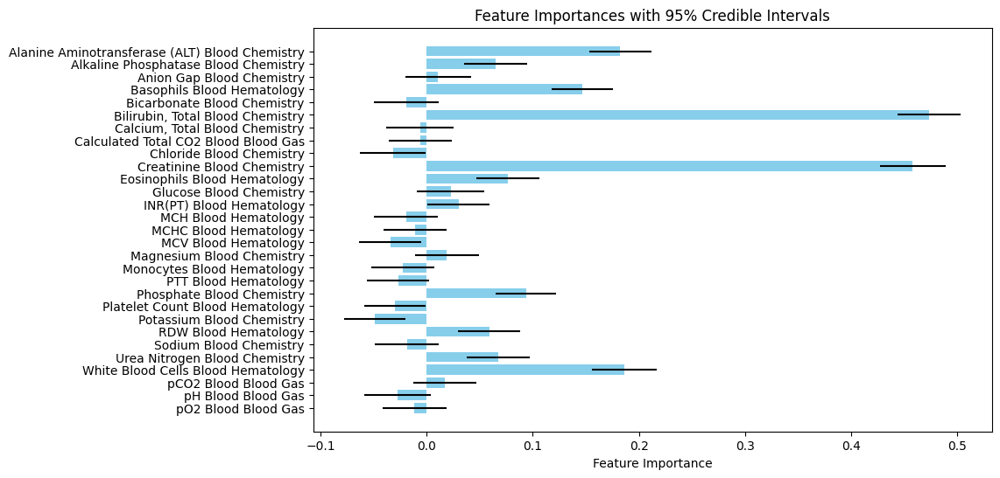

In [ ]:
# visualization

import matplotlib.pyplot as plt

# Extract feature names, weights, and CIs for plotting
feature_names = [feature_names[idx] for idx, _, _, _ in credible_intervals]
weights = [weight for _, weight, _, _ in credible_intervals]
lower_bounds = [lower for _, _, lower, _ in credible_intervals]
upper_bounds = [upper for _, _, _, upper in credible_intervals]

# Compute error bars
errors = [weight - lower for weight, lower in zip(weights, lower_bounds)]

# Plot
plt.figure(figsize=(10, 6))
plt.barh(feature_names, weights, xerr=errors, align='center', color='skyblue', ecolor='black')
plt.xlabel('Feature Importance')
plt.title('Feature Importances with 95% Credible Intervals')
plt.gca().invert_yaxis()  # Invert Y-axis for better readability
plt.show()
